In [166]:
#import libraries
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

This is a dataframe we created with all paths of all images found in the dataframe

In [167]:
df = pd.read_csv("A1.csv")
df.head()

,Unnamed: 0,paths,c,r,e,n
0,0,DATASET/A1/c1/r1/images/e0/c1r1e0n1.tif,1,1,0,1
1,1,DATASET/A1/c1/r1/images/e0/c1r1e0n2.tif,1,1,0,2
2,2,DATASET/A1/c1/r1/images/e0/c1r1e0n3.tif,1,1,0,3
3,3,DATASET/A1/c1/r1/images/e0/c1r1e0n4.tif,1,1,0,4
4,4,DATASET/A1/c1/r1/images/e0/c1r1e0n5.tif,1,1,0,5


The approach we are going to take is to get a sample of 100x100 of each image, vectorize it so each pixel is going to be a component/feature and attempt to cluster it with kmeans.

In [175]:
WINDOW_SIZE = 100
samples = [] #list where to append vectors, so sample of each image

for im_path in df["paths"]:
    crop = cv2.cvtColor(cv2.imread(im_path)[0:WINDOW_SIZE,0:WINDOW_SIZE], cv2.COLOR_BGR2GRAY) #load image, crop -> window_size -> convert to grayscale 1ch
    samples.append(list(np.asarray(crop).reshape(-1)))

#convert list of lists -> np matrix
samples = np.matrix(samples)

In [176]:
#just for debugging, check size of samples matrix, 3148 samples 10000 size vectors 100x100
samples.shape

(3148, 10000)

In [177]:
#Apply normalization and other corrections

mu = samples.mean(axis=1) # mean values
sigma = samples.std(axis=1) + np.ptp(samples, axis=1)/20.0 # standard deviation (plus a small value)

samples = (samples-mu.reshape([-1,1]))/(sigma.reshape([-1,1])) # subtract the mean and divide by std

# Set NaN values (if exist) to 0
w = np.isnan(samples)
samples[w] = 0


In [178]:
#apply kmeans
NUM_CLUST =5

km = KMeans(n_clusters=NUM_CLUST, max_iter=50, n_init=1, verbose=False)
km.fit(samples)

/Users/josepsmachine/miniforge3/envs/chaos/lib/python3.10/site-packages/sklearn/utils/validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


KMeans(max_iter=50, n_clusters=5, n_init=1, verbose=False)

In [179]:
#save kmean generated label for each image
df = df.assign(km_label=km.labels_)

Now we print 

In [184]:
df.shape

(3148, 7)

km_label:  0


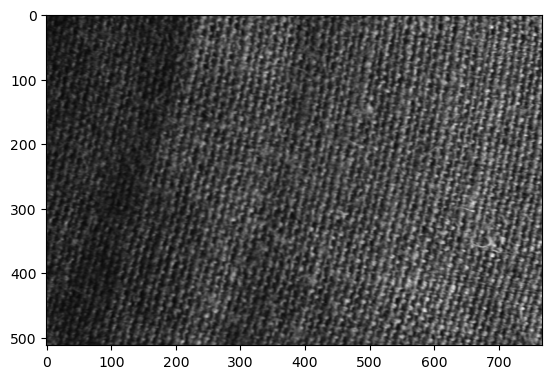

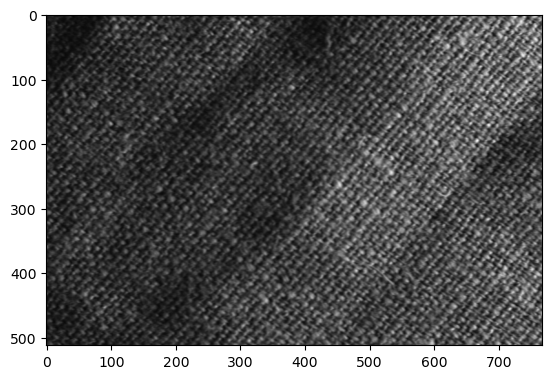

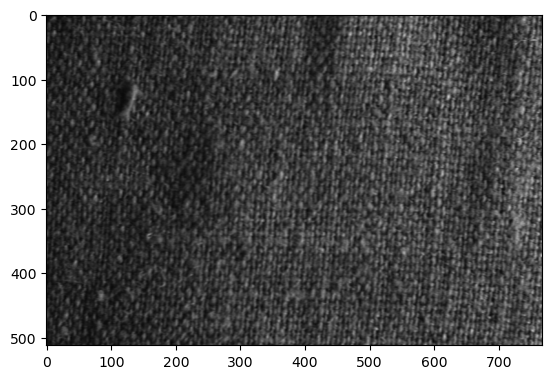

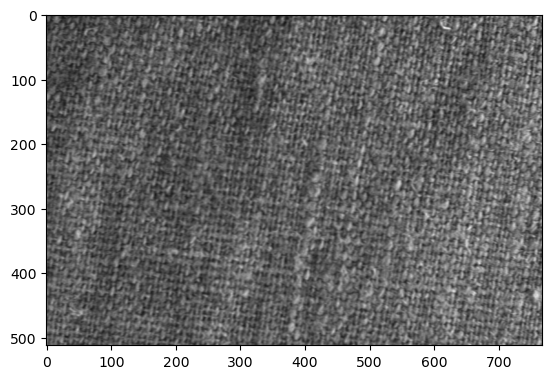

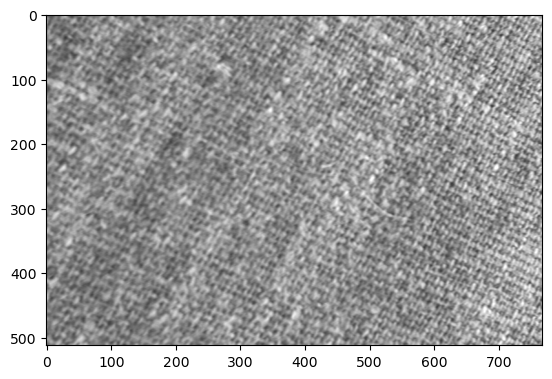

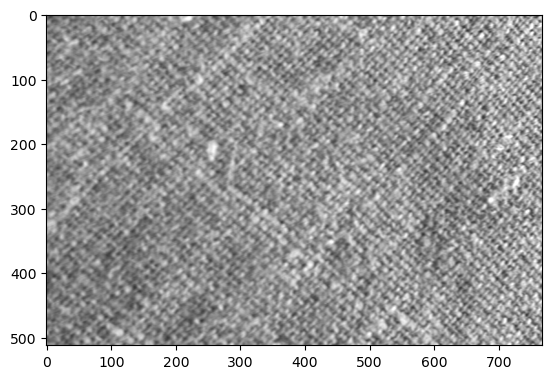

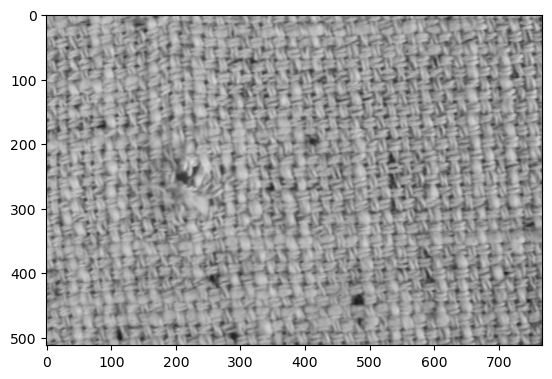

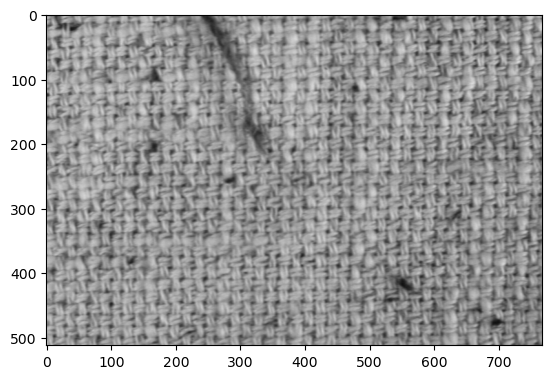

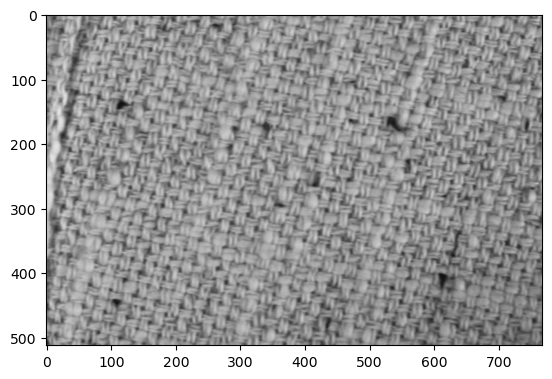

km_label:  1


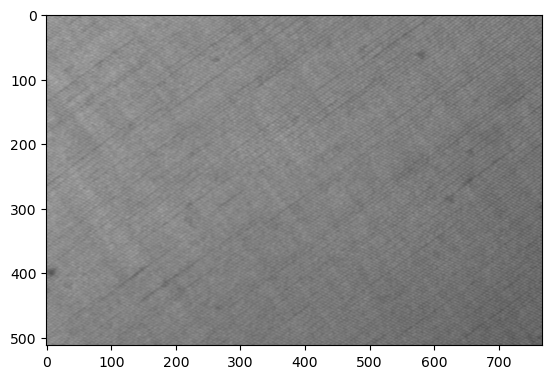

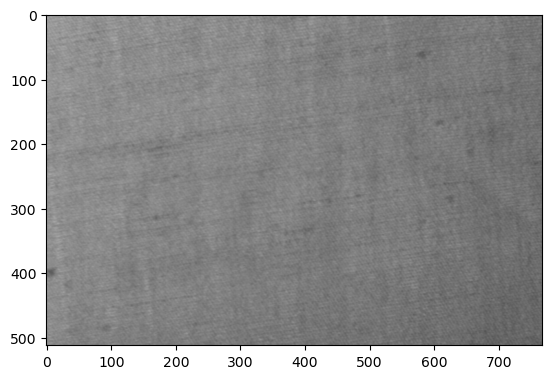

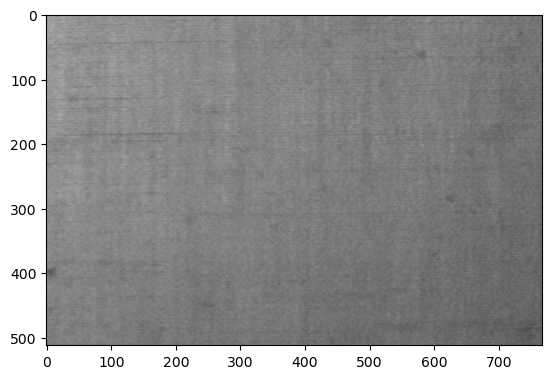

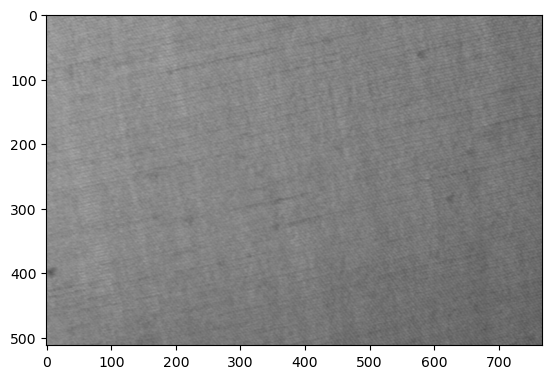

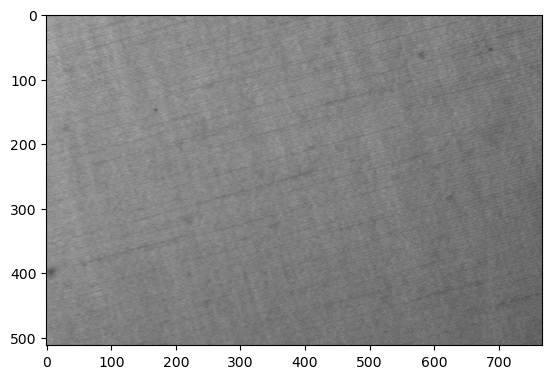

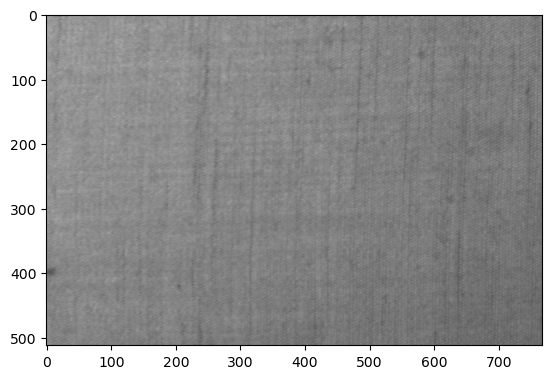

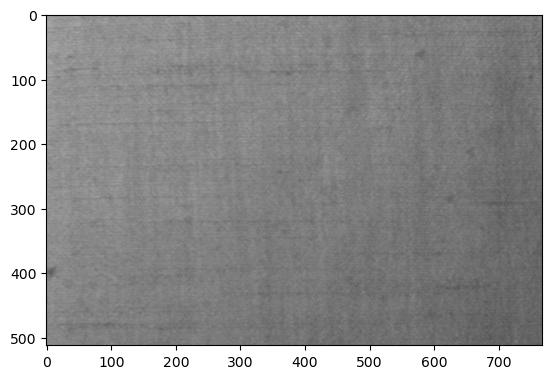

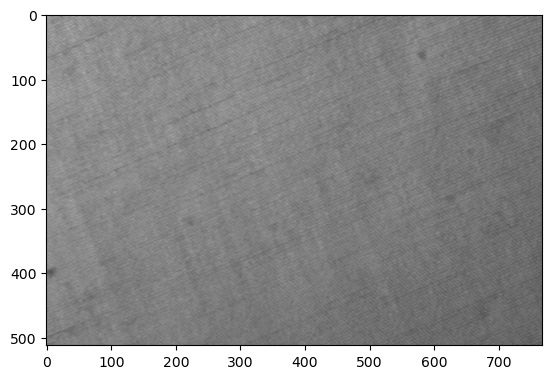

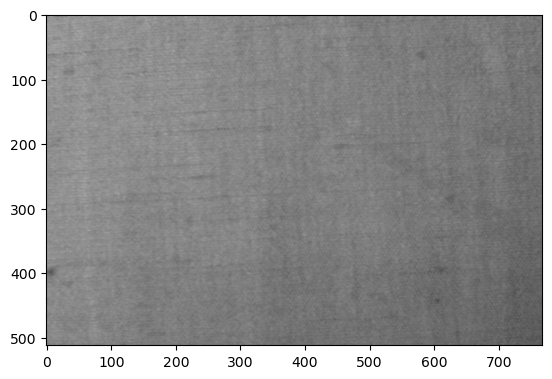

km_label:  2


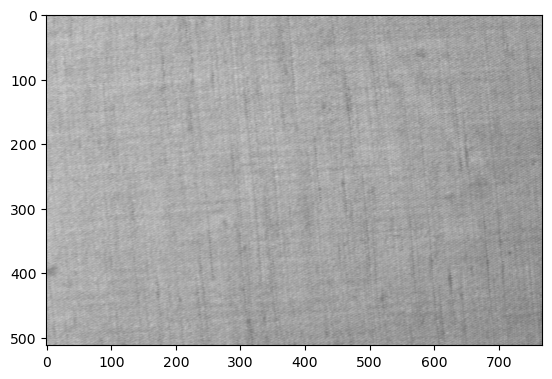

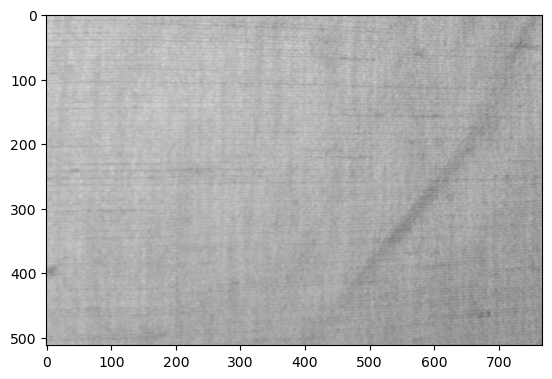

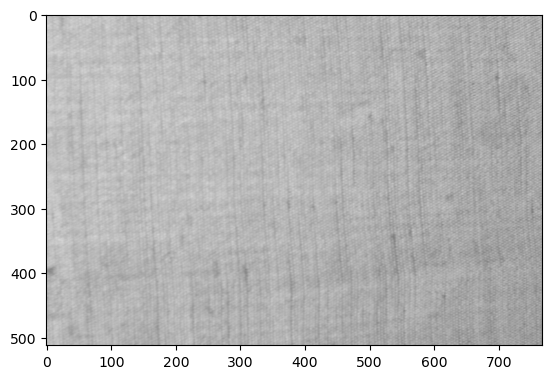

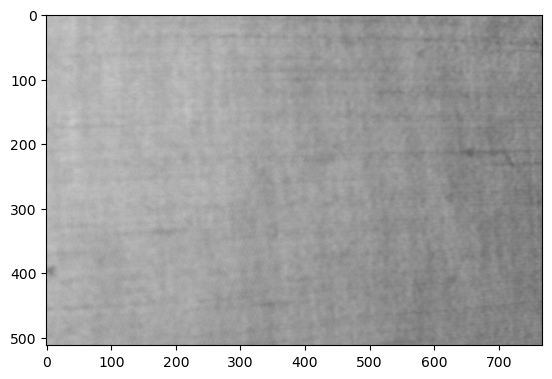

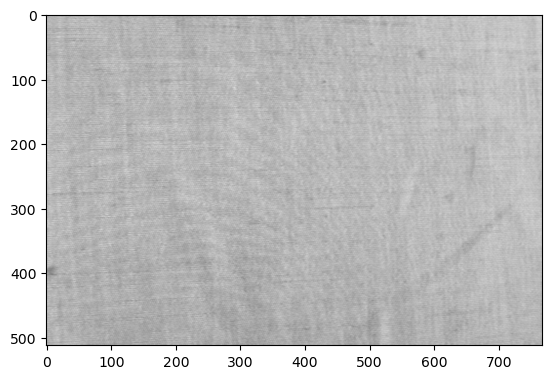

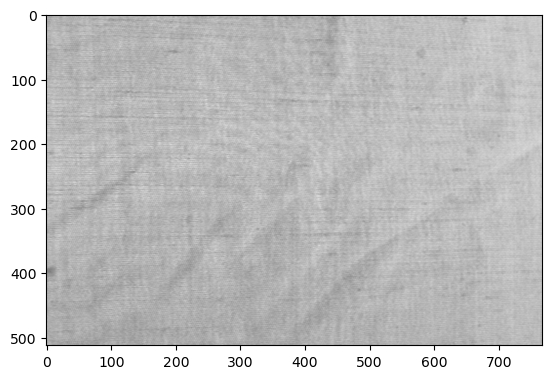

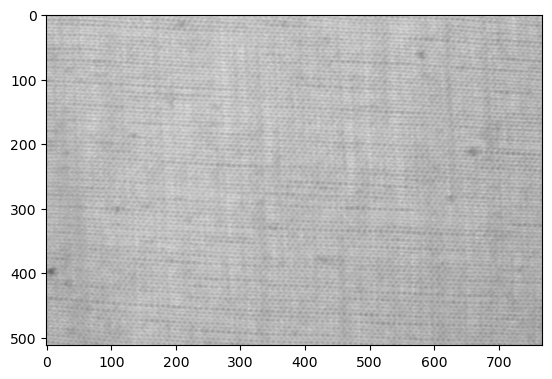

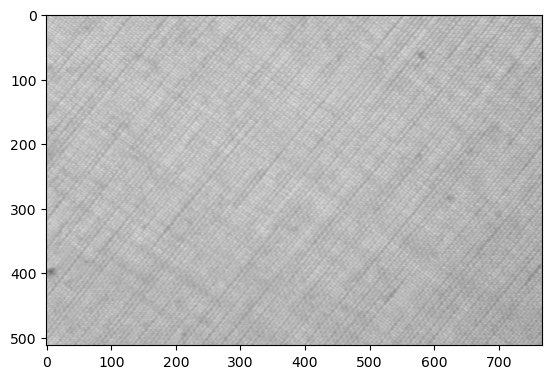

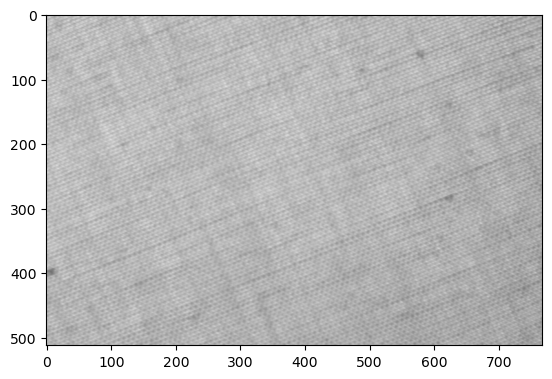

km_label:  3


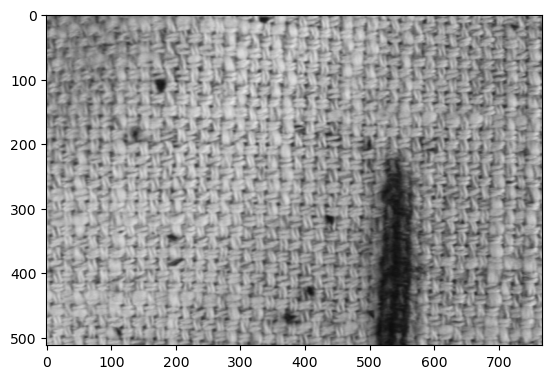

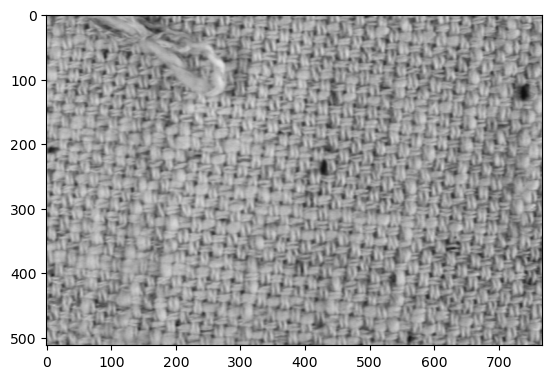

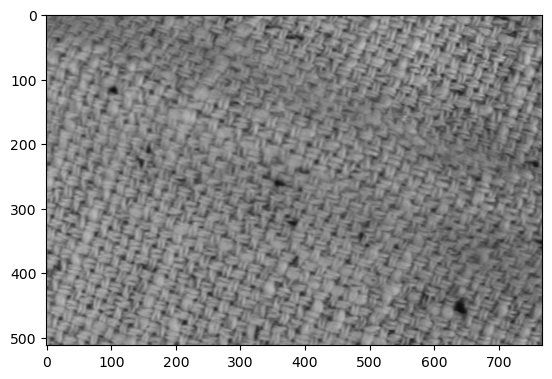

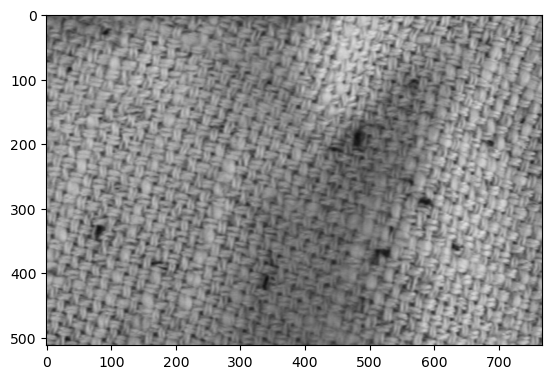

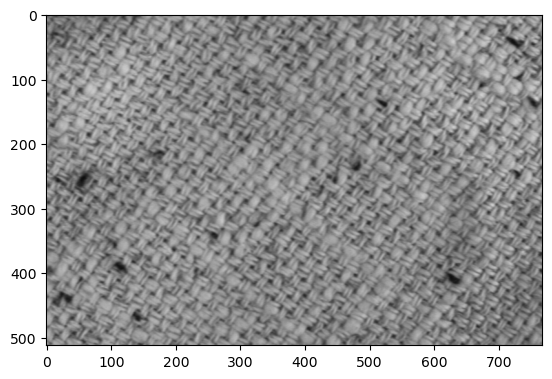

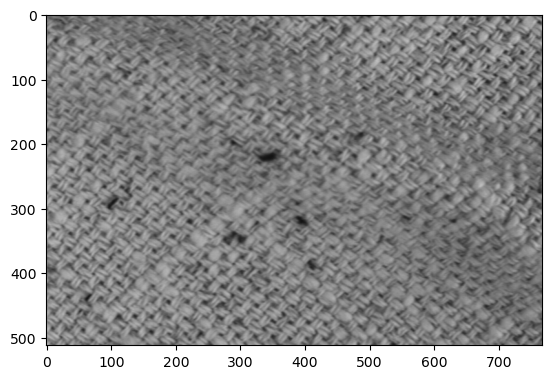

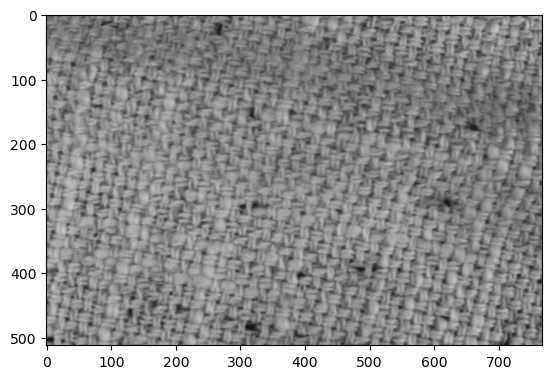

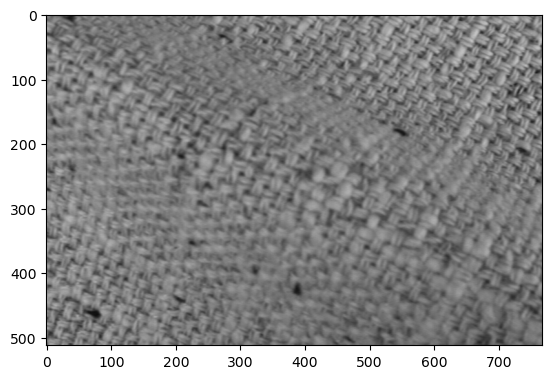

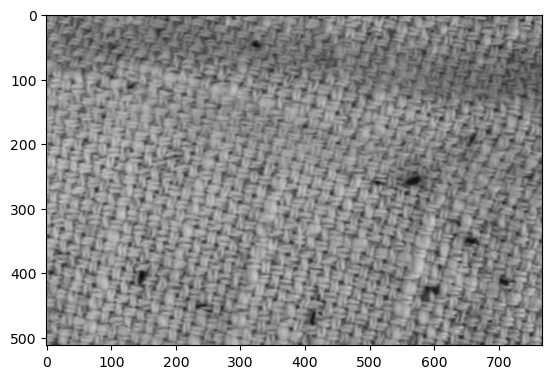

km_label:  4


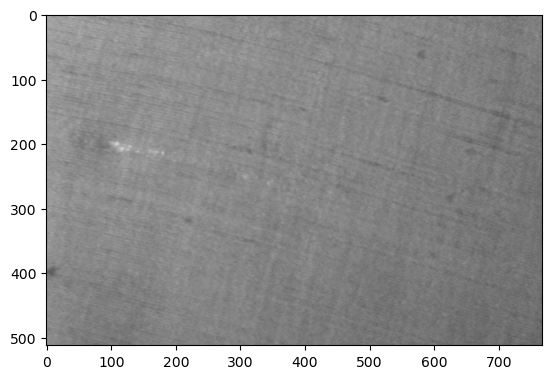

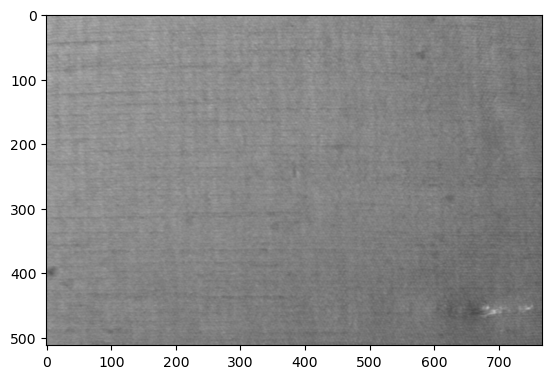

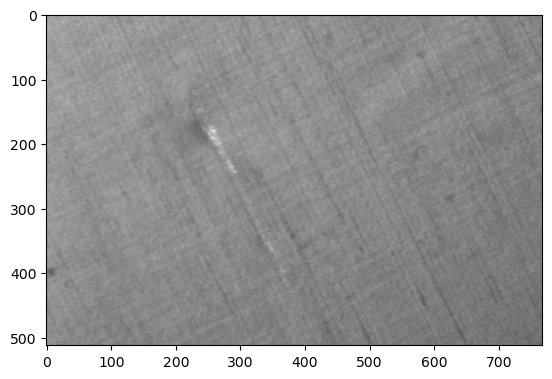

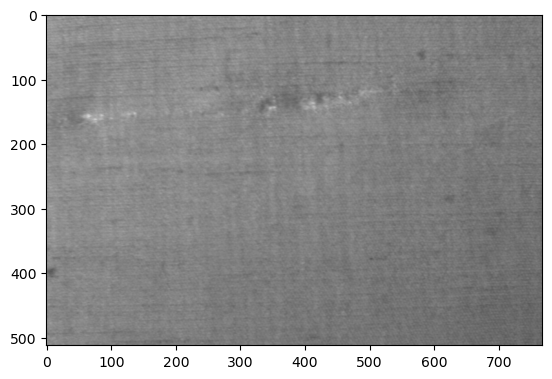

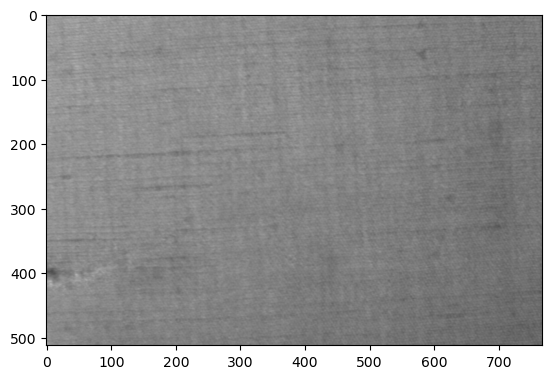

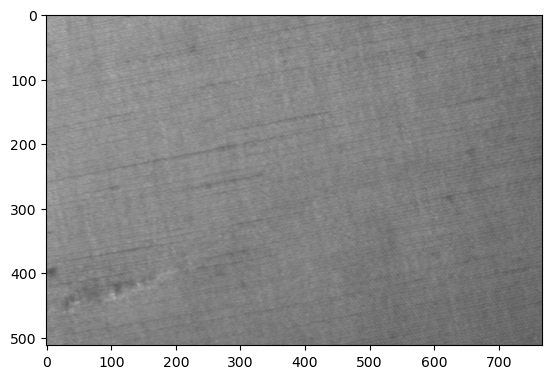

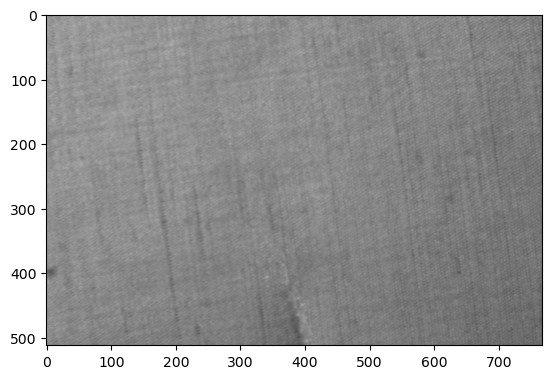

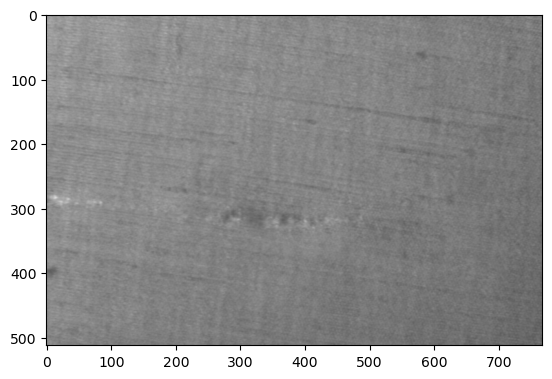

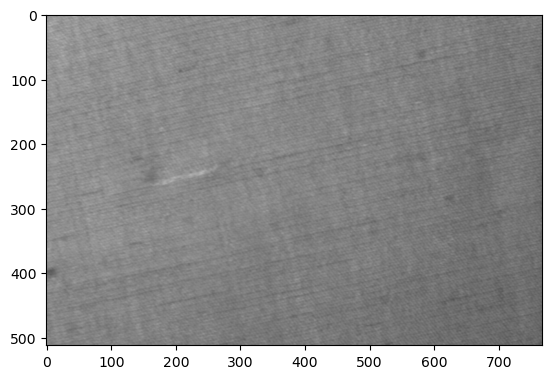

In [190]:
for i in range(5):
    cluster_ex = df[df["km_label"]==i][31:40].paths
    print("km_label: ",i)
    for pth in cluster_ex:
        image = cv2.imread(pth)
        plt.imshow(image)
        plt.show()

c:2,r:2,e:4,n:1,label:2


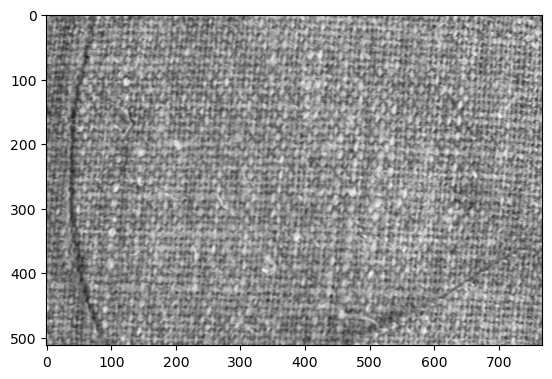

c:2,r:2,e:4,n:2,label:2


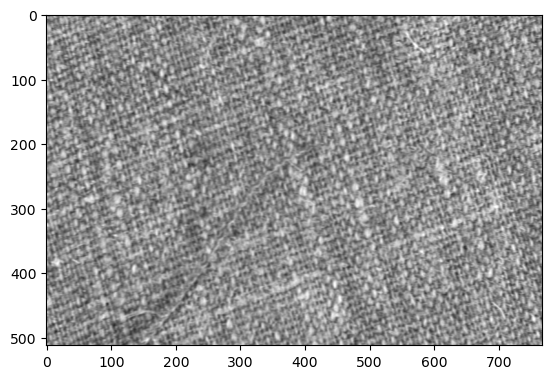

c:2,r:2,e:4,n:3,label:2


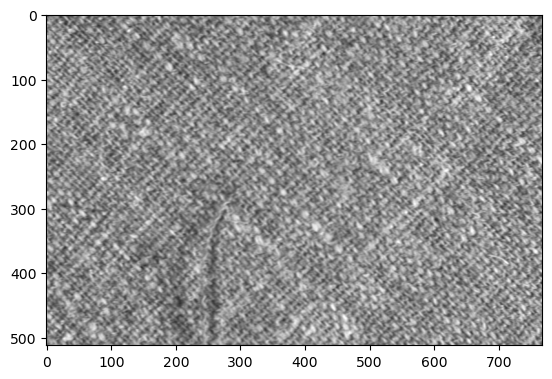

c:2,r:2,e:4,n:4,label:1


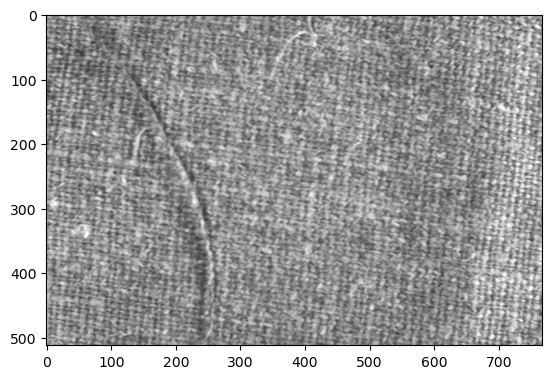

c:2,r:2,e:4,n:5,label:2


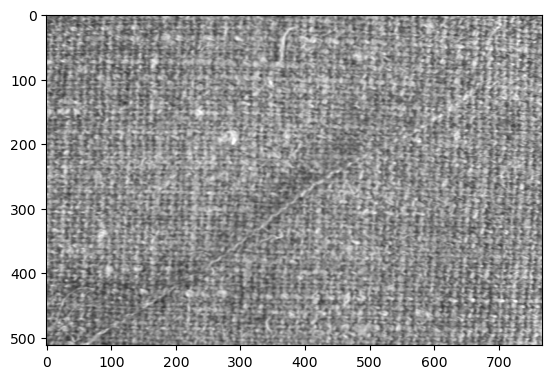

c:2,r:2,e:4,n:6,label:2


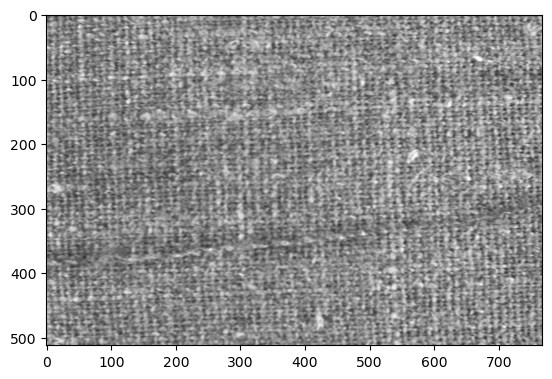

c:2,r:2,e:4,n:7,label:2


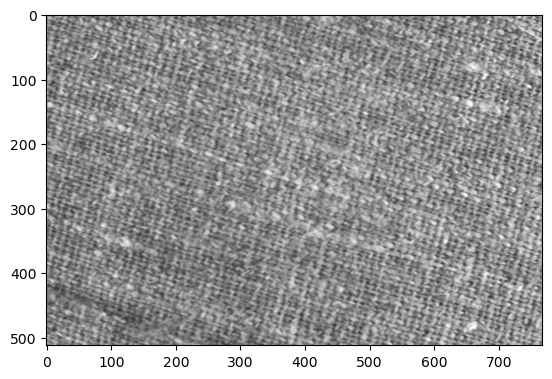

c:2,r:2,e:4,n:8,label:2


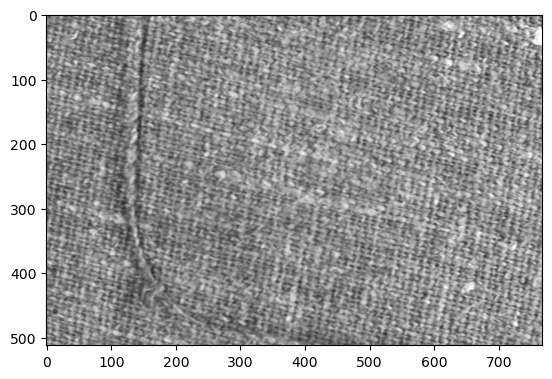

c:2,r:2,e:4,n:9,label:2


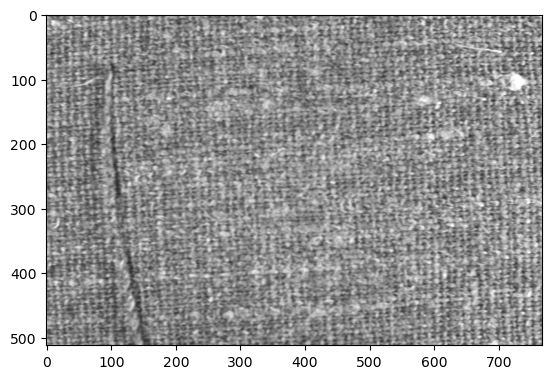

c:2,r:2,e:4,n:10,label:0


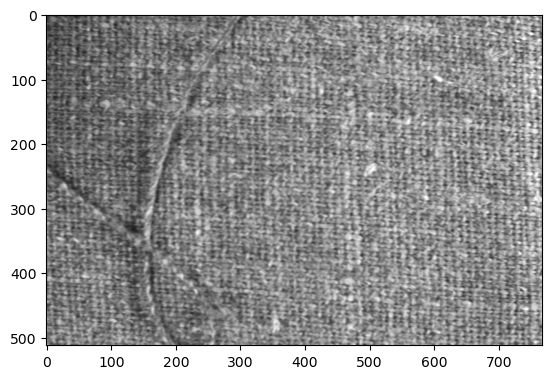

c:2,r:2,e:4,n:11,label:2


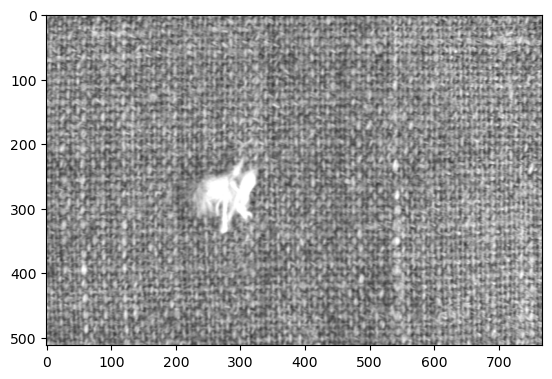

c:2,r:2,e:4,n:12,label:2


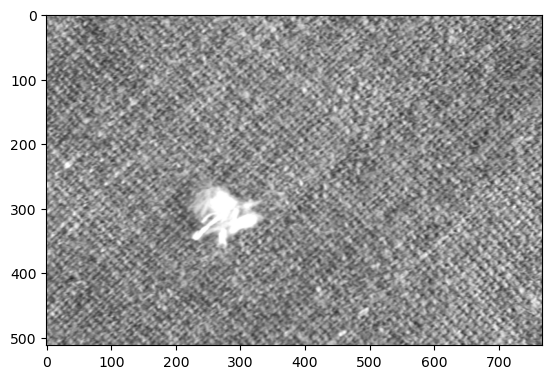

c:2,r:2,e:4,n:13,label:2


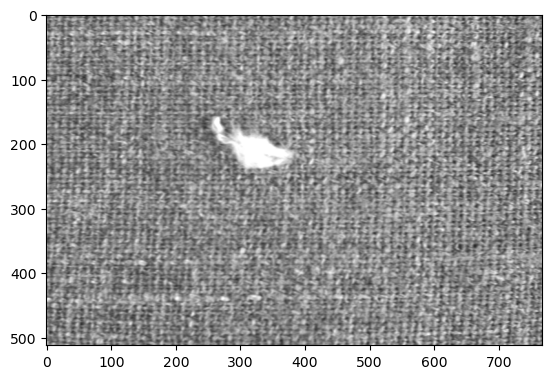

c:2,r:2,e:4,n:14,label:2


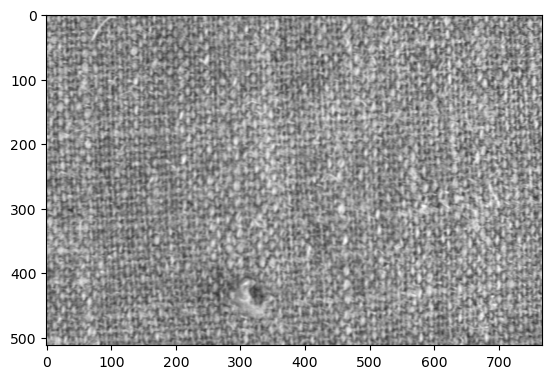

c:2,r:2,e:4,n:15,label:2


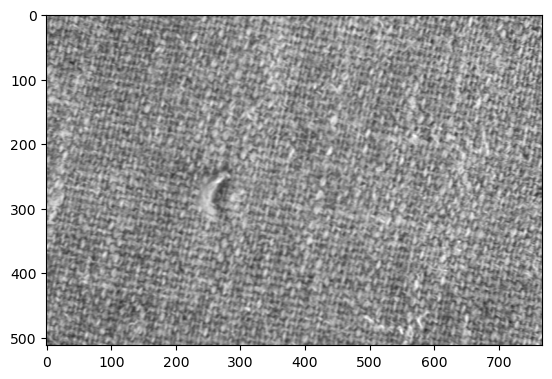

c:2,r:2,e:4,n:16,label:2


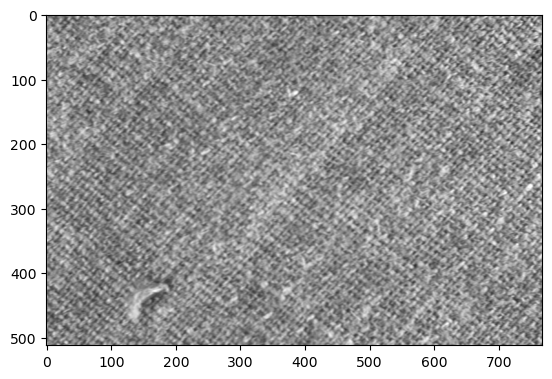

c:2,r:2,e:4,n:17,label:2


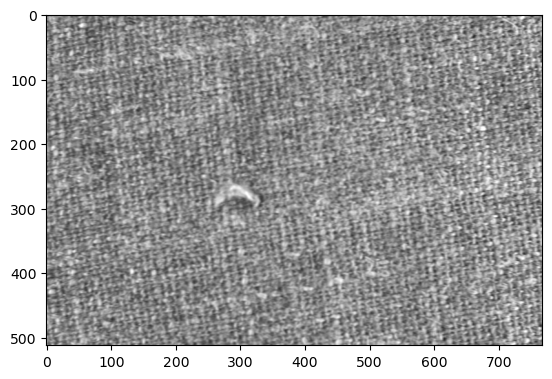

c:2,r:2,e:4,n:18,label:2


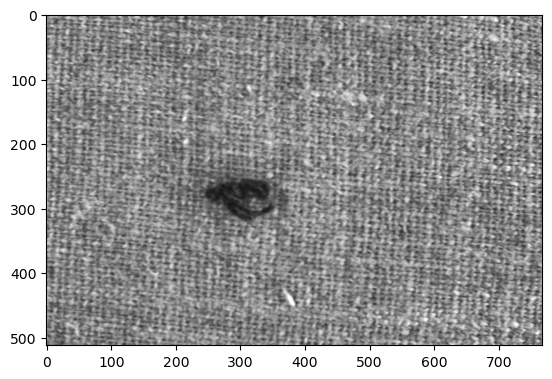

c:2,r:2,e:4,n:19,label:2


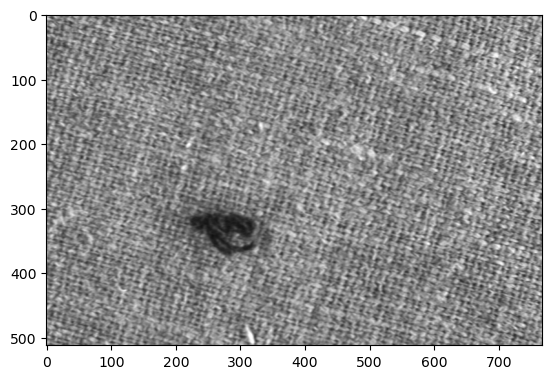

c:2,r:2,e:4,n:20,label:2


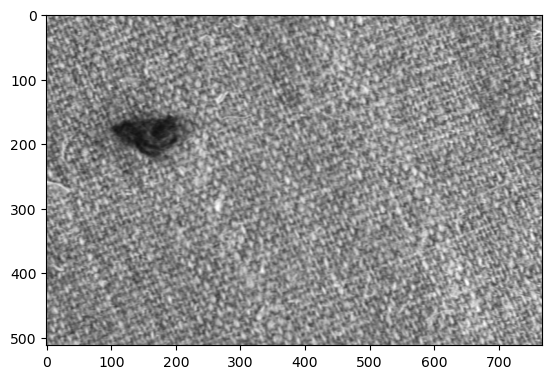

In [181]:
for i in range(1000,1020):
    print("c:"+str(df["c"][i])+",r:"+str(df["r"][i])+",e:"+str(df["e"][i])+",n:"+str(df["n"][i])+",label:"+str(df["km_label"][i]))
    image = cv2.imread(df["paths"][i])
    plt.imshow(image)
    plt.show()



In [140]:
img = cv2.cvtColor(cv2.imread("DATASET/A1/c1/r1/images/e0/c1r1e0n1.tif"), cv2.COLOR_BGR2GRAY)
crp = image[0:100,0:100]
km.predict(np.asarray(crp).reshape(1,-1))

array([3], dtype=int32)

In [92]:
import cv2
crop = img_grey[0:100, 0:100]
samples_df = pd.DataFrame(columns=np.append(["paths"],)
for im_path in df["paths"][0:10]:
    image = cv2.cvtColor(cv2.imread(im_path), cv2.COLOR_BGR2GRAY)
    crop = image[0:100,0:100]
    samples_df(list(np.asarray(crop).reshape(-1)))
    data["paths"].append(im_path)


In [94]:
dd = pd.DataFrame(data)
df = df.merge(dd, left_on='paths', right_on='paths')


In [95]:
df

,Unnamed: 0,paths,c,r,e,n,0:0,0:1,0:2,0:3,...,99:90,99:91,99:92,99:93,99:94,99:95,99:96,99:97,99:98,99:99
0,0,DATASET/A1/c1/r1/images/e0/c1r1e0n1.tif,1,1,0,1,170,170,166,160,...,150,152,156,154,154,154,154,152,150,148
1,1,DATASET/A1/c1/r1/images/e0/c1r1e0n2.tif,1,1,0,2,166,160,154,150,...,152,154,154,152,150,148,150,156,158,158
2,2,DATASET/A1/c1/r1/images/e0/c1r1e0n3.tif,1,1,0,3,154,158,156,152,...,148,148,142,140,140,144,146,146,146,144
3,3,DATASET/A1/c1/r1/images/e0/c1r1e0n4.tif,1,1,0,4,150,152,152,154,...,148,150,148,146,142,136,132,128,128,130
4,4,DATASET/A1/c1/r1/images/e0/c1r1e0n5.tif,1,1,0,5,166,164,160,158,...,132,136,136,136,134,134,136,140,140,142
5,5,DATASET/A1/c1/r1/images/e0/c1r1e0n6.tif,1,1,0,6,154,150,146,142,...,146,148,142,144,146,150,152,156,152,148
6,6,DATASET/A1/c1/r1/images/e0/c1r1e0n7.tif,1,1,0,7,156,154,154,150,...,150,150,146,148,150,150,146,144,142,142
7,7,DATASET/A1/c1/r1/images/e0/c1r1e0n8.tif,1,1,0,8,170,172,166,160,...,138,136,134,138,146,152,152,146,142,140
8,8,DATASET/A1/c1/r1/images/e0/c1r1e0n9.tif,1,1,0,9,156,152,152,154,...,144,146,146,148,156,156,156,156,156,156
9,9,DATASET/A1/c1/r1/images/e0/c1r1e0n10.tif,1,1,0,10,168,168,166,162,...,126,128,128,128,130,134,140,146,148,146
